# Spectral Indices: Beyond NDVI

NDVI taught us a powerful idea: by combining different spectral bands mathematically, we can reveal properties invisible to the human eye.

But NDVI only detects **vegetation**. What about water? Urban areas? Fire damage?

In this notebook we'll learn three more spectral indices:

| Index | Name | What it detects |
|-------|------|----------------|
| **NDVI** | Normalized Difference Vegetation Index | Vegetation health |
| **NDWI** | Normalized Difference Water Index | Water bodies |
| **NDBI** | Normalized Difference Built-up Index | Urban/built-up areas |
| **NBR** | Normalized Burn Ratio | Fire severity/burn scars |

**The pattern:** All these indices use the same formula structure:
```
Index = (Band_A - Band_B) / (Band_A + Band_B)
```
The magic is in choosing which bands to use!

---
## 1. Setup

In [1]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Connect to Planetary Computer
catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

/Users/hds-altec009/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Connected to Planetary Computer


---
## 2. Choose a Location with Variety

To see all indices in action, we need a location with:
- Vegetation (for NDVI)
- Water (for NDWI)
- Urban/built-up areas (for NDBI)

Let's use an area near Fort Collins that has a reservoir, farmland, and some development.

In [28]:
# Area with water (Horsetooth Reservoir), vegetation, and urban areas
bbox = [103.70, 1.20, 104.05, 1.40]

print(f"Area of interest:")
print(f"  Longitude: {bbox[0]} to {bbox[2]}")
print(f"  Latitude:  {bbox[1]} to {bbox[3]}")

Area of interest:
  Longitude: 103.7 to 104.05
  Latitude:  1.2 to 1.4


---
## 3. Load Satellite Data

We need more bands than before! Here's what each index requires:

| Index | Bands needed |
|-------|-------------|
| NDVI | Red (B04), NIR (B08) |
| NDWI | Green (B03), NIR (B08) |
| NDBI | SWIR (B11), NIR (B08) |
| NBR | NIR (B08), SWIR (B12) |

**New bands:**
- **B11 (SWIR1)** — Short-Wave Infrared at 1610 nm
- **B12 (SWIR2)** — Short-Wave Infrared at 2190 nm

SWIR bands are sensitive to moisture content and are key for detecting built-up areas and burn scars.

In [32]:
# Search for a clear summer image
search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,
    datetime="2023-07-01/2024-08-31",
    query={"eo:cloud_cover": {"lt": 10}},
)

items = list(search.items())
print(f"Found {len(items)} clear images")

# Pick the clearest one
items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
item = items_sorted[0]

print(f"\nSelected: {item.datetime.strftime('%Y-%m-%d')}")
print(f"Cloud cover: {item.properties.get('eo:cloud_cover', 0):.1f}%")

Found 1 clear images

Selected: 2023-07-24
Cloud cover: 6.3%


In [33]:
# Sign and load all the bands we need
signed_item = pc.sign(item)

data = stac_load(
    [signed_item],
    bands=["B02", "B03", "B04", "B08", "B11", "B12"],  # Blue, Green, Red, NIR, SWIR1, SWIR2
    bbox=bbox,
    crs="EPSG:4326",
    resolution=0.0002,  # Slightly coarser for faster loading
    groupby="solar_day",
)

print("Loaded bands:", list(data.data_vars))
print(f"Image shape: {data['B04'].shape}")

Loaded bands: ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']
Image shape: (1, 1000, 1750)


---
## 4. Helper Functions

In [34]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def normalized_difference(band_a, band_b):
    """
    Compute normalized difference: (A - B) / (A + B)
    This is the foundation of NDVI, NDWI, NDBI, NBR, etc.
    """
    a = band_a.astype('float32')
    b = band_b.astype('float32')
    return (a - b) / (a + b + 1e-6)

# Extract bands as numpy arrays
blue = data["B02"].isel(time=0).values
green = data["B03"].isel(time=0).values
red = data["B04"].isel(time=0).values
nir = data["B08"].isel(time=0).values
swir1 = data["B11"].isel(time=0).values  # 1610 nm
swir2 = data["B12"].isel(time=0).values  # 2190 nm

print("Bands extracted and ready!")

Bands extracted and ready!


---
## 5. True Color Reference

First, let's see what the area looks like in true color.

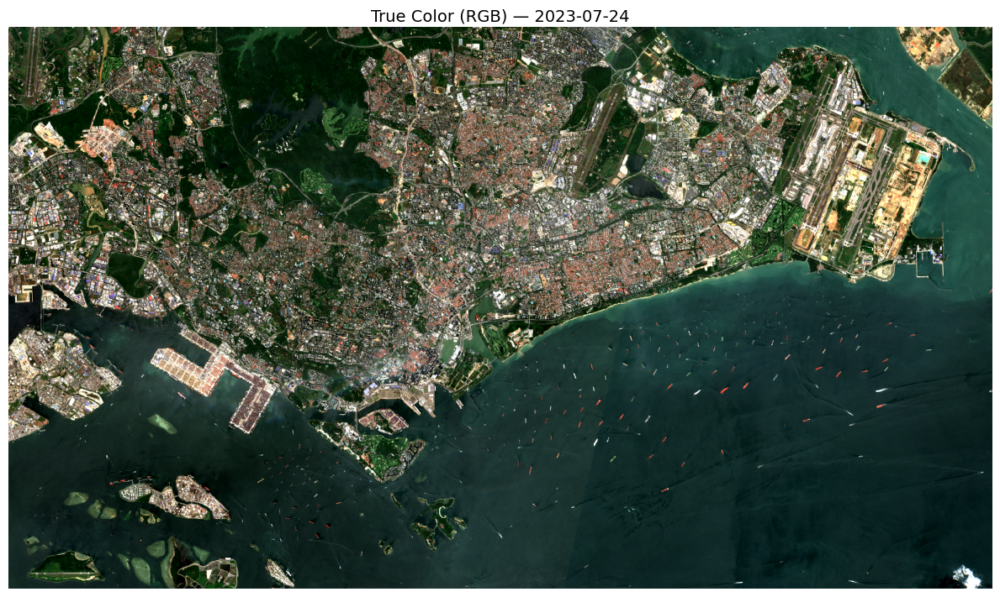

In [35]:
# Create RGB composite
rgb = normalize_for_display(np.stack([red, green, blue], axis=-1))

fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(rgb)
ax.set_title(f"True Color (RGB) — {item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()

---
## 6. NDVI — Vegetation Index (Review)

You already know this one! Quick review:

$$NDVI = \frac{NIR - Red}{NIR + Red}$$

**Why it works:** Healthy vegetation absorbs red light (for photosynthesis) and strongly reflects NIR.

In [37]:
# Compute NDVI
ndvi = normalized_difference(nir, red)

print(f"NDVI range: {np.nanmin(ndvi):.2f} to {np.nanmax(ndvi):.2f}")
print(f"NDVI mean: {np.nanmean(ndvi):.2f}")

NDVI range: -0.38 to 0.74
NDVI mean: 0.11


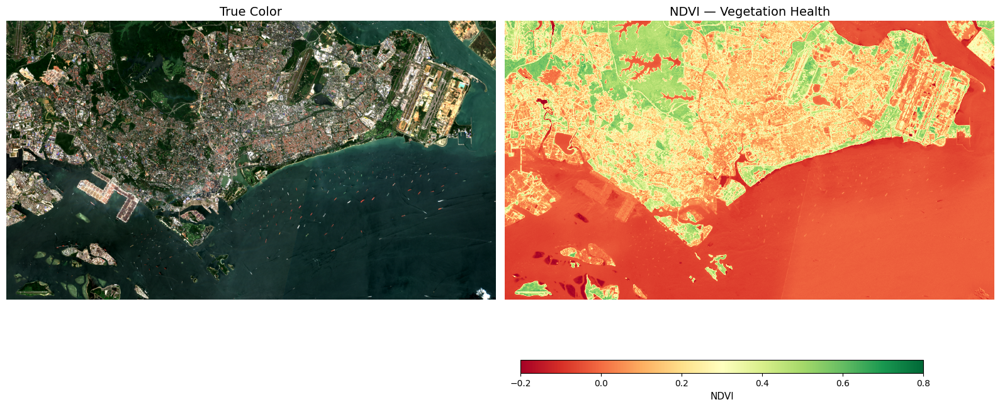

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis('off')

im = axes[1].imshow(ndvi, cmap='RdYlGn', vmin=-0.2, vmax=0.8)
axes[1].set_title("NDVI — Vegetation Health", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
cbar_ax = fig.add_axes([0.52, 0.08, 0.4, 0.03])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDVI', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

---
## 7. NDWI — Water Index

$$NDWI = \frac{Green - NIR}{Green + NIR}$$

**Why it works:**
- Water **absorbs** NIR strongly (appears dark in NIR)
- Water **reflects** some green light
- Result: Water has positive NDWI, vegetation has negative NDWI

**Values:**
- **> 0.3** — Water
- **0 to 0.3** — Flooding, wet soil
- **< 0** — Vegetation, soil, urban

In [39]:
# Compute NDWI
ndwi = normalized_difference(green, nir)

print(f"NDWI range: {np.nanmin(ndwi):.2f} to {np.nanmax(ndwi):.2f}")
print(f"NDWI mean: {np.nanmean(ndwi):.2f}")

NDWI range: -0.62 to 0.50
NDWI mean: -0.07


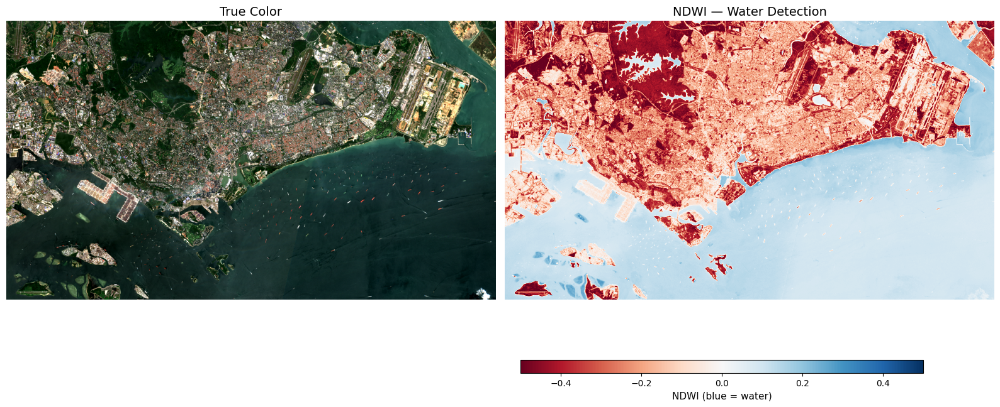

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis('off')

# Use blue colormap - water should be blue!
im = axes[1].imshow(ndwi, cmap='RdBu', vmin=-0.5, vmax=0.5)
axes[1].set_title("NDWI — Water Detection", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
cbar_ax = fig.add_axes([0.52, 0.08, 0.4, 0.03])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDWI (blue = water)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### Interpreting NDWI

- **Blue areas (positive NDWI):** Water bodies — reservoirs, lakes, rivers
- **Red areas (negative NDWI):** Vegetation (opposite of water behavior)
- **White areas (near zero):** Bare soil, urban areas

Notice how NDWI is almost the inverse of NDVI — where vegetation is high, water index is low.

---
## 8. NDBI — Built-up Index

$$NDBI = \frac{SWIR1 - NIR}{SWIR1 + NIR}$$

**Why it works:**
- Built-up areas (concrete, asphalt, buildings) reflect more SWIR than NIR
- Vegetation reflects more NIR than SWIR
- Result: Urban areas have positive NDBI, vegetation has negative NDBI

**Values:**
- **> 0** — Built-up/urban areas
- **< 0** — Vegetation, water

In [41]:
# Compute NDBI
ndbi = normalized_difference(swir1, nir)

print(f"NDBI range: {np.nanmin(ndbi):.2f} to {np.nanmax(ndbi):.2f}")
print(f"NDBI mean: {np.nanmean(ndbi):.2f}")

NDBI range: -0.59 to 0.58
NDBI mean: -0.02


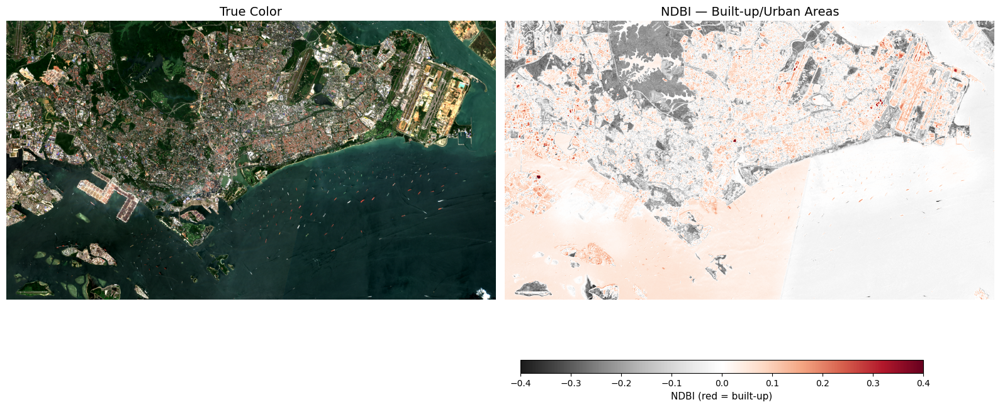

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis('off')

# Use a colormap where urban (positive) is visible
im = axes[1].imshow(ndbi, cmap='RdGy_r', vmin=-0.4, vmax=0.4)
axes[1].set_title("NDBI — Built-up/Urban Areas", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
cbar_ax = fig.add_axes([0.52, 0.08, 0.4, 0.03])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDBI (red = built-up)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### Interpreting NDBI

- **Red areas (positive NDBI):** Built-up/urban — roads, buildings, parking lots
- **Gray areas (negative NDBI):** Vegetation
- **Note:** Bare soil can also show positive NDBI, so it's not perfect for urban detection alone

NDBI is often combined with NDVI to improve urban area detection (urban = high NDBI AND low NDVI).

---
## 9. NBR — Normalized Burn Ratio

$$NBR = \frac{NIR - SWIR2}{NIR + SWIR2}$$

**Why it works:**
- Healthy vegetation: High NIR, low SWIR2 → **High NBR**
- Burned areas: Low NIR (dead vegetation), high SWIR2 (charcoal, ash) → **Low/negative NBR**

**Values:**
- **> 0.1** — Healthy vegetation
- **-0.1 to 0.1** — Bare soil, sparse vegetation
- **< -0.1** — Burned areas

**Key use:** Compare NBR before and after a fire to map burn severity (dNBR = NBR_pre - NBR_post)

In [43]:
# Compute NBR
nbr = normalized_difference(nir, swir2)

print(f"NBR range: {np.nanmin(nbr):.2f} to {np.nanmax(nbr):.2f}")
print(f"NBR mean: {np.nanmean(nbr):.2f}")

NBR range: -0.64 to 0.64
NBR mean: 0.07


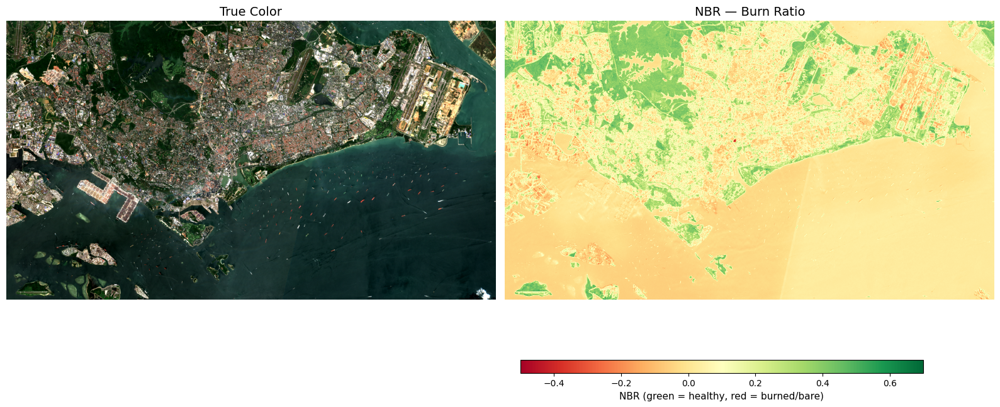

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(rgb)
axes[0].set_title("True Color", fontsize=14)
axes[0].axis('off')

# Use colormap where burned (negative) shows as red/brown
im = axes[1].imshow(nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.7)
axes[1].set_title("NBR — Burn Ratio", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
cbar_ax = fig.add_axes([0.52, 0.08, 0.4, 0.03])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NBR (green = healthy, red = burned/bare)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### Interpreting NBR

In this image (no recent fires), NBR looks similar to NDVI:
- **Green areas:** Healthy vegetation
- **Red/brown areas:** Bare soil, water, or urban

NBR becomes powerful when comparing **before vs after** a fire — the burned areas show a dramatic drop in NBR.

---
## 10. All Indices Comparison

Let's view all four indices side by side to understand their differences.

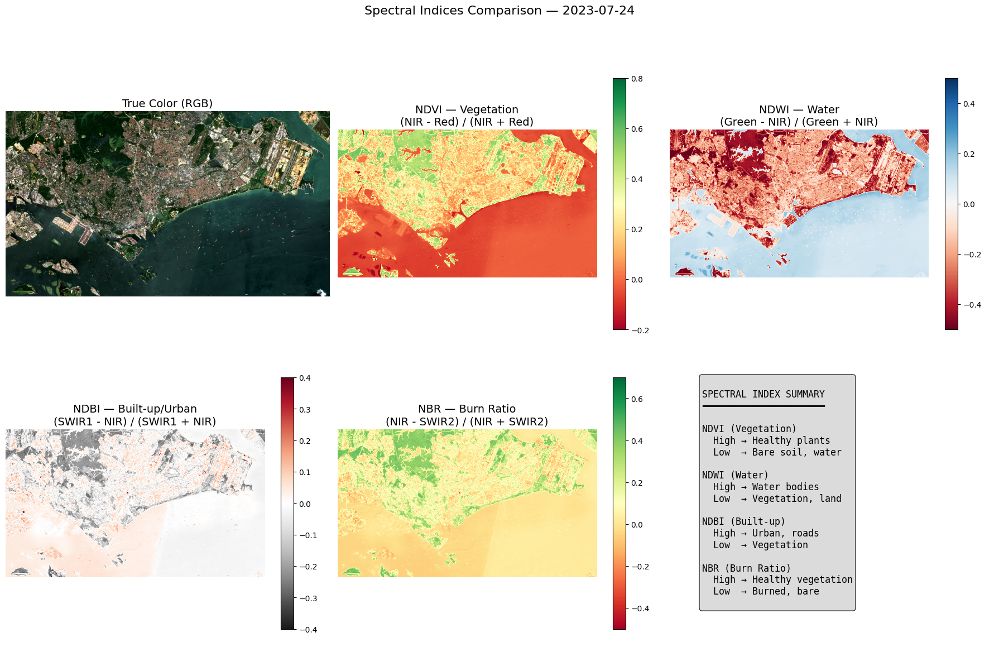

In [45]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# True Color
axes[0, 0].imshow(rgb)
axes[0, 0].set_title("True Color (RGB)", fontsize=14)
axes[0, 0].axis('off')

# NDVI
im_ndvi = axes[0, 1].imshow(ndvi, cmap='RdYlGn', vmin=-0.2, vmax=0.8)
axes[0, 1].set_title("NDVI — Vegetation\n(NIR - Red) / (NIR + Red)", fontsize=14)
axes[0, 1].axis('off')
plt.colorbar(im_ndvi, ax=axes[0, 1], shrink=0.8)

# NDWI
im_ndwi = axes[0, 2].imshow(ndwi, cmap='RdBu', vmin=-0.5, vmax=0.5)
axes[0, 2].set_title("NDWI — Water\n(Green - NIR) / (Green + NIR)", fontsize=14)
axes[0, 2].axis('off')
plt.colorbar(im_ndwi, ax=axes[0, 2], shrink=0.8)

# NDBI
im_ndbi = axes[1, 0].imshow(ndbi, cmap='RdGy_r', vmin=-0.4, vmax=0.4)
axes[1, 0].set_title("NDBI — Built-up/Urban\n(SWIR1 - NIR) / (SWIR1 + NIR)", fontsize=14)
axes[1, 0].axis('off')
plt.colorbar(im_ndbi, ax=axes[1, 0], shrink=0.8)

# NBR
im_nbr = axes[1, 1].imshow(nbr, cmap='RdYlGn', vmin=-0.5, vmax=0.7)
axes[1, 1].set_title("NBR — Burn Ratio\n(NIR - SWIR2) / (NIR + SWIR2)", fontsize=14)
axes[1, 1].axis('off')
plt.colorbar(im_nbr, ax=axes[1, 1], shrink=0.8)

# Summary text
axes[1, 2].axis('off')
summary_text = """
SPECTRAL INDEX SUMMARY
━━━━━━━━━━━━━━━━━━━━━━

NDVI (Vegetation)
  High → Healthy plants
  Low  → Bare soil, water

NDWI (Water)
  High → Water bodies
  Low  → Vegetation, land

NDBI (Built-up)
  High → Urban, roads
  Low  → Vegetation

NBR (Burn Ratio)
  High → Healthy vegetation
  Low  → Burned, bare
"""
axes[1, 2].text(0.1, 0.9, summary_text, transform=axes[1, 2].transAxes,
                fontsize=12, verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

plt.suptitle(f"Spectral Indices Comparison — {item.datetime.strftime('%Y-%m-%d')}", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

---
## 11. Create Index Functions for Reuse

Let's create clean functions we can use in future notebooks.

In [46]:
def compute_ndvi(nir, red):
    """Normalized Difference Vegetation Index: (NIR - Red) / (NIR + Red)"""
    return normalized_difference(nir, red)

def compute_ndwi(green, nir):
    """Normalized Difference Water Index: (Green - NIR) / (Green + NIR)"""
    return normalized_difference(green, nir)

def compute_ndbi(swir1, nir):
    """Normalized Difference Built-up Index: (SWIR1 - NIR) / (SWIR1 + NIR)"""
    return normalized_difference(swir1, nir)

def compute_nbr(nir, swir2):
    """Normalized Burn Ratio: (NIR - SWIR2) / (NIR + SWIR2)"""
    return normalized_difference(nir, swir2)

def compute_dnbr(nbr_pre, nbr_post):
    """
    Differenced NBR for burn severity mapping.
    Positive values indicate burn severity.
    """
    return nbr_pre - nbr_post

print("Index functions defined!")
print("  - compute_ndvi(nir, red)")
print("  - compute_ndwi(green, nir)")
print("  - compute_ndbi(swir1, nir)")
print("  - compute_nbr(nir, swir2)")
print("  - compute_dnbr(nbr_pre, nbr_post)")

Index functions defined!
  - compute_ndvi(nir, red)
  - compute_ndwi(green, nir)
  - compute_ndbi(swir1, nir)
  - compute_nbr(nir, swir2)
  - compute_dnbr(nbr_pre, nbr_post)


---
## 12. Quick Reference: Sentinel-2 Bands

Here's a complete reference for Sentinel-2 bands:

In [47]:
sentinel2_bands = """
SENTINEL-2 BAND REFERENCE
══════════════════════════════════════════════════════════════════
Band   Name          Wavelength   Resolution   Common Uses
──────────────────────────────────────────────────────────────────
B01    Coastal       443 nm       60m          Aerosol detection
B02    Blue          490 nm       10m          True color, water
B03    Green         560 nm       10m          True color, NDWI
B04    Red           665 nm       10m          True color, NDVI
B05    Red Edge 1    705 nm       20m          Vegetation stress
B06    Red Edge 2    740 nm       20m          Vegetation stress
B07    Red Edge 3    783 nm       20m          Vegetation stress
B08    NIR           842 nm       10m          NDVI, NDWI, NBR
B8A    NIR Narrow    865 nm       20m          Vegetation, water vapor
B09    Water Vapor   945 nm       60m          Atmospheric correction
B10    Cirrus        1375 nm      60m          Cloud detection
B11    SWIR1         1610 nm      20m          NDBI, moisture
B12    SWIR2         2190 nm      20m          NBR, geology
──────────────────────────────────────────────────────────────────

KEY INDICES AND THEIR BANDS:
  NDVI  = (B08 - B04) / (B08 + B04)    Vegetation health
  NDWI  = (B03 - B08) / (B03 + B08)    Water detection
  NDBI  = (B11 - B08) / (B11 + B08)    Urban/built-up
  NBR   = (B08 - B12) / (B08 + B12)    Burn severity
"""
print(sentinel2_bands)


SENTINEL-2 BAND REFERENCE
══════════════════════════════════════════════════════════════════
Band   Name          Wavelength   Resolution   Common Uses
──────────────────────────────────────────────────────────────────
B01    Coastal       443 nm       60m          Aerosol detection
B02    Blue          490 nm       10m          True color, water
B03    Green         560 nm       10m          True color, NDWI
B04    Red           665 nm       10m          True color, NDVI
B05    Red Edge 1    705 nm       20m          Vegetation stress
B06    Red Edge 2    740 nm       20m          Vegetation stress
B07    Red Edge 3    783 nm       20m          Vegetation stress
B08    NIR           842 nm       10m          NDVI, NDWI, NBR
B8A    NIR Narrow    865 nm       20m          Vegetation, water vapor
B09    Water Vapor   945 nm       60m          Atmospheric correction
B10    Cirrus        1375 nm      60m          Cloud detection
B11    SWIR1         1610 nm      20m          NDBI, moistur

---
## Summary

**What we learned:**

All spectral indices follow the same pattern:
$$Index = \frac{Band_A - Band_B}{Band_A + Band_B}$$

The power is in choosing the right bands for what you want to detect:

| Index | Formula | Detects | Key Insight |
|-------|---------|---------|-------------|
| NDVI | (NIR - Red) / (NIR + Red) | Vegetation | Plants reflect NIR, absorb Red |
| NDWI | (Green - NIR) / (Green + NIR) | Water | Water absorbs NIR strongly |
| NDBI | (SWIR1 - NIR) / (SWIR1 + NIR) | Built-up | Urban areas reflect SWIR |
| NBR | (NIR - SWIR2) / (NIR + SWIR2) | Burn scars | Burned areas lose NIR, gain SWIR |

**Key bands to remember:**
- **NIR (B08)** — The workhorse, used in almost every index
- **SWIR (B11, B12)** — Sensitive to moisture and burn damage

**Next steps:**
- Apply NBR to detect a real wildfire (before/after comparison)
- Use NDWI to track flooding or drought
- Combine NDVI and NDBI for land cover classification